# Credit Score Classification

# TABLE OF CONTENTS

**1.** [INTRODUCTION](#Section1)<br>
**2.** [PROBLEM STATEMENT](#Section2)<br>
**3.** [IMPORTING THE IMPORTANT LIBRARIES](#Section3)<br>
**4.** [IMPORTING THE CREDIT SCORE DATASET](#Section4)<br>
**5.** [DATA PREPROCESSING](#Section5)<br>

  - **5.1.** [**HANDLING INCONSISTENCIES/DUPLICATES/REDUNDANCIES**](#Section5.1)
  - **5.2.** [**HANDLING MISSING VALUES**](#Section5.2)
  - **5.3.** [**HANDLING OUTLIERS**](#Section5.3)

**6.** [EXPLORATORY DATA ANALYSIS](#Section6)<br>

  - **6.1.** [**DATA GRANULARITY AND DATA IMBALANCE**](#Section6.1)
  - **6.2.** [**UNIVARIATE EXPLORATION OF METRICS IMPORTANCE ON TARGET**](#Section6.2)
  - **6.3.** [**UNIVARIATE EXPLORATION OF DIMENSIONS IMPORTANCE ON TARGET**](#Section6.3)
  
**7.** [FEATURE ENGINEERING](#Section7)<br>
**8.** [FEATURE SCALING](#Section8)<br>
**9.** [DIMENSIONALITY REDUCTION](#Section9)<br>
**10.** [MODEL TRAINING AND PREDICTION](#Section10)<br>
**11.** [MODEL EVALUATION](#Section11)<br>
**12.** [HYPERPARAMETER TUNING](#Section12)<br>

<a id = Section1></a>
# 1.INTRODUCTION

Over a year, a global finance company has collected basic bank details and gathered a lot of credit related information. The management wants to build an intelligent system to segregate the people into credit score brackets to reduce the manual efforts. Given a person's credit related information build a machine learning model that can classify the credit score.

<a id = Section2></a>
# 2. PROBLEM STATEMENT

I have been appointed as a data scientist in the company to help in following:

- Given a person’s credit-related information, build a machine learning model that can classify the credit score.

- The dataset contains 1 lakh records with 28 features. There is an inherent chronological order within the dataset as for each customer 8 consecutive month period data is present across 8 records.

<a id = Section3></a>
# 3. IMPORTING THE IMPORTANT LIBRARIES

In [3]:
import numpy as np                                    # To perform numerical operations
import pandas as pd                                   # Importing for panel data analysis
                                                

#-------------------------------------------------------------------------------------------
from matplotlib import pyplot as plt                  # To perform data visualisation
import seaborn as sns                                 # To perform data visualisation                                        
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier

from scipy.stats import chi2_contingency              # To perform chi sqr test
from scipy.stats import f_oneway                      # To perform ANOVA test

import umap                                           # To perform PCA on non-linear data
from sklearn.preprocessing import StandardScaler      # To perform feature scaling
from sklearn.model_selection import train_test_split  # To perform train test split

from sklearn.model_selection import GridSearchCV      # To perform hyperparameter tuning
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix # To perform model evaluation
from sklearn.metrics import precision_score, recall_score, f1_score  # To perform model evaluation

sns.set_theme(style="white", palette="muted")
%matplotlib inline

#-------------------------------------------------------------------------------------------
import warnings                                       # Importing warning to disable runtime warnings
warnings.filterwarnings("ignore")

2024-09-24 12:35:54.169121: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [4]:
pip install umap-learn

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install --upgrade pip

Note: you may need to restart the kernel to use updated packages.


<a id = Section4></a>
# 4. IMPORTING THE CREDIT SCORE DATASET

In [4]:
df = pd.read_csv('/Users/kanishksharma/desktop/Data Science/Kaggle Datasets/Classification Problems/Credit Score Classification/Credit_score_cleaned_data.csv', encoding="latin-1")
df

,Customer_ID,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Last_Loan_9,Last_Loan_8,Last_Loan_7,Last_Loan_6,Last_Loan_5,Last_Loan_4,Last_Loan_3,Last_Loan_2,Last_Loan_1,Credit_Score
0,CUS_0x98ed,31,Journalist,22229.060,1672.421667,6,4,5.0,3,10,...,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Debt Consolidation Loan,Standard
1,CUS_0x36b4,43,Musician,17060.705,1685.725417,8,3,11.0,4,24,...,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Auto Loan,Auto Loan,Standard
2,CUS_0x105b,24,Accountant,34428.210,2575.017500,2,4,8.0,0,3,...,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Good
3,CUS_0x4c4a,21,Accountant,12613.920,1155.160000,4,6,13.0,3,14,...,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Personal Loan,Student Loan,Home Equity Loan,Standard
4,CUS_0x612f,31,Journalist,34775.160,3048.930000,7,9,25.0,5,20,...,No Loan,No Loan,No Loan,No Loan,Auto Loan,Mortgage Loan,Auto Loan,Payday Loan,Not Specified,Poor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,CUS_0xc52a,46,Writer,35032.660,2853.388333,10,6,33.0,7,48,...,No Loan,No Loan,Credit-Builder Loan,Student Loan,Personal Loan,Mortgage Loan,Payday Loan,Payday Loan,Student Loan,Poor
99996,CUS_0x83cc,34,Engineer,125047.240,10682.603333,2,5,9.0,0,11,...,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Standard
99997,CUS_0x6ae6,26,Lawyer,9045.485,644.664842,8,7,20.0,6,52,...,No Loan,No Loan,No Loan,Not Specified,Student Loan,Auto Loan,Not Specified,Student Loan,Auto Loan,Poor
99998,CUS_0x6f0c,20,Lawyer,53564.880,4207.740000,5,3,13.0,2,6,...,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Mortgage Loan,Personal Loan,Standard


In [5]:
df_credit = df.copy()  ## Creating a copy of original dataframe for operations

In [8]:
##----------------------------END OF SECTION - DATA IMPORT--------------------------------##

<a id = Section5></a>
# 5. DATA PREPROCESSING

1. HANDLING INCONSISTENCIES/DUPLICATES/REDUNDANCIES
2. HANDLING MISSING VALUES
3. HANDLING OUTLIERS

In [6]:
df_credit.shape      ## The credit score dataset has 1,00,000 records and 32 attributes

(100000, 32)

In [7]:
df_credit.info()                 ## Analysing the data types for all attributes.

# This dataset is a combination of 17 metrices (like Age,Annual Income etc.)... 
# and 15 dimensions (like occupation and credit score)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 32 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Customer_ID               100000 non-null  object 
 1   Age                       100000 non-null  int64  
 2   Occupation                100000 non-null  object 
 3   Annual_Income             100000 non-null  float64
 4   Monthly_Inhand_Salary     100000 non-null  float64
 5   Num_Bank_Accounts         100000 non-null  int64  
 6   Num_Credit_Card           100000 non-null  int64  
 7   Interest_Rate             100000 non-null  float64
 8   Num_of_Loan               100000 non-null  int64  
 9   Delay_from_due_date       100000 non-null  int64  
 10  Num_of_Delayed_Payment    100000 non-null  int64  
 11  Changed_Credit_Limit      100000 non-null  float64
 12  Num_Credit_Inquiries      100000 non-null  int64  
 13  Credit_Mix                100000 non-null  ob

5.1 Handling Duplicates/Redundancies

In [8]:
df_credit[df_credit.duplicated()]    ## No Duplicates records found

,Customer_ID,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Last_Loan_9,Last_Loan_8,Last_Loan_7,Last_Loan_6,Last_Loan_5,Last_Loan_4,Last_Loan_3,Last_Loan_2,Last_Loan_1,Credit_Score


In [12]:
# Found no inconsistent values in all attributes. 
## There are some deviation like zeros in some attributes but they are explained/treated in EDA section.

In [13]:
# Before we delve into missing values & outlier treatment, we need to add the 'month' column which denotes
## the month of the year for which the data has been gathered. 
## This column is needed as credit details for one customer ID is recorded multiples times..
## each time for each month (Jan - August).
## The month column needs to be added to this dataframe from other old uncleaned version of credit score data
## present in the Data Explorer section provided in the probem.

In [9]:
# Importing the old uncleaned version of credit score data

df_uncleaned = pd.read_csv('/Users/kanishksharma/desktop/Data Science/Kaggle Datasets/Classification Problems/Credit Score Classification/credit_score.csv', encoding="latin-1")
df_uncleaned

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.65161,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,41.255522,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.809083,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,33.638208,31 Years and 9 Months,No,35.104023,251.67258219721603,Low_spent_Large_value_payments,319.164979,Standard


In [10]:
# Making a subset dataframe from uncleaned data which containts all the required attributes to be merged with main df_credit dataset

df_uncleaned_new = df_uncleaned[['Customer_ID','Credit_Utilization_Ratio','Month']]
df_uncleaned_new

,Customer_ID,Credit_Utilization_Ratio,Month
0,CUS_0xd40,26.822620,January
1,CUS_0xd40,31.944960,February
2,CUS_0xd40,28.609352,March
3,CUS_0xd40,31.377862,April
4,CUS_0xd40,24.797347,May
...,...,...,...
99995,CUS_0x942c,34.663572,April
99996,CUS_0x942c,40.565631,May
99997,CUS_0x942c,41.255522,June
99998,CUS_0x942c,33.638208,July


In [11]:
# Merging both the dataframes on both common Customer ID and Credit_Utilization_Ratio attributes..
## As Credit_Utilization_Ratio is different for each month for a customer and hence can act as a primary key with customer ID together to join both data frames.

df_credit_merged = pd.merge(left=df_credit, right=df_uncleaned_new, how='inner', on=['Customer_ID', 'Credit_Utilization_Ratio'])
df_credit_merged

# Post merging, 98045 records out of 100,000 records are common between two and hence, 
# its fine to discard the rest ~2000 records as its mere 2 percent of total records.

,Customer_ID,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Last_Loan_8,Last_Loan_7,Last_Loan_6,Last_Loan_5,Last_Loan_4,Last_Loan_3,Last_Loan_2,Last_Loan_1,Credit_Score,Month
0,CUS_0x98ed,31,Journalist,22229.060,1672.421667,6,4,5.0,3,10,...,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Debt Consolidation Loan,Standard,August
1,CUS_0x36b4,43,Musician,17060.705,1685.725417,8,3,11.0,4,24,...,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Auto Loan,Auto Loan,Standard,May
2,CUS_0x105b,24,Accountant,34428.210,2575.017500,2,4,8.0,0,3,...,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Good,April
3,CUS_0x4c4a,21,Accountant,12613.920,1155.160000,4,6,13.0,3,14,...,No Loan,No Loan,No Loan,No Loan,No Loan,Personal Loan,Student Loan,Home Equity Loan,Standard,January
4,CUS_0x612f,31,Journalist,34775.160,3048.930000,7,9,25.0,5,20,...,No Loan,No Loan,No Loan,Auto Loan,Mortgage Loan,Auto Loan,Payday Loan,Not Specified,Poor,June
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98040,CUS_0xc52a,46,Writer,35032.660,2853.388333,10,6,33.0,7,48,...,No Loan,Credit-Builder Loan,Student Loan,Personal Loan,Mortgage Loan,Payday Loan,Payday Loan,Student Loan,Poor,June
98041,CUS_0x83cc,34,Engineer,125047.240,10682.603333,2,5,9.0,0,11,...,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Standard,March
98042,CUS_0x6ae6,26,Lawyer,9045.485,644.664842,8,7,20.0,6,52,...,No Loan,No Loan,Not Specified,Student Loan,Auto Loan,Not Specified,Student Loan,Auto Loan,Poor,June
98043,CUS_0x6f0c,20,Lawyer,53564.880,4207.740000,5,3,13.0,2,6,...,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Mortgage Loan,Personal Loan,Standard,February


5.2 Handling Missing Values

In [12]:
df_credit_merged.isna().sum()             ## No missing values found in merged dataset

Customer_ID                 0
Age                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Last_Loan_9                 0
Last_Loan_8                 0
Last_Loan_7                 0
Last_Loan_6                 0
Last_Loan_5                 0
Last_Loan_4                 0
Last_Loan_3                 0
Last_Loan_2                 0
Last_Loan_1                 0
Credit_Score                0
Month                       0
dtype: int

5.3 Handling Outliers

In [13]:
## Analysing the descriptive statistics of the metrices.

df_credit_merged.describe()

# Inferences:

# 1. There is definitely presence of considerable outliers in the dataset as..
# 2. There is significant right skewness in some metrices (Mean is greater than median as the.. 
# 3. Mean is attracted towards higher outliers/extereme values. For eg:- in Annual_Income attribute,
# 4. Mean of 50568.11 > Median of 37070.)
# 5. While, there is negligible left skewness in some metrices (Median is greater than mean as the.. 
# 6. Mean is attracted towards lower outliers/extereme values. For eg:- in Num_of_Delayed_Payment attribute,
# 7. Median of 14 > Mean of 13.32.)
# 8. These outliers are also depicted with the help of univariate analysis in immediate below section.
# 9. Moreover, these outliers will be treated in the later section.

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000
mean,33.311245,50568.118656,4204.031882,5.366495,5.533102,14.519741,3.529430,21.065021,13.323535,10.384734,5.771156,1425.669660,32.374548,221.306380,88.221098,193.717813,403.948804
std,10.764666,38329.975361,3189.999957,2.592863,2.067681,8.736793,2.445419,14.865191,6.271874,6.781336,3.862562,1154.816166,5.115019,99.628706,83.263827,194.596713,214.828887
min,14.000000,7005.930000,303.645417,0.000000,0.000000,1.000000,0.000000,-5.000000,0.000000,-6.490000,0.000000,0.230000,20.000000,1.000000,-1.000000,0.000000,0.007760
25%,24.000000,19357.890000,1628.297500,3.000000,4.000000,7.000000,2.000000,10.000000,9.000000,5.330000,3.000000,566.400000,28.141653,145.000000,25.590900,73.754199,270.427292
50%,33.000000,37070.000000,3099.872500,5.000000,5.000000,13.000000,3.000000,18.000000,14.000000,9.400000,5.000000,1165.770000,32.461730,220.000000,61.613296,129.447673,337.505030
75%,42.000000,71735.480000,5969.673333,7.000000,7.000000,20.000000,5.000000,28.000000,18.000000,14.840000,8.000000,1942.400000,36.580673,302.000000,131.472173,234.375729,472.481497
max,56.000000,179987.280000,15204.633333,11.000000,11.000000,34.000000,9.000000,67.000000,28.000000,36.970000,17.000000,4998.070000,50.000000,404.000000,357.406068,1977.326102,1602.040519


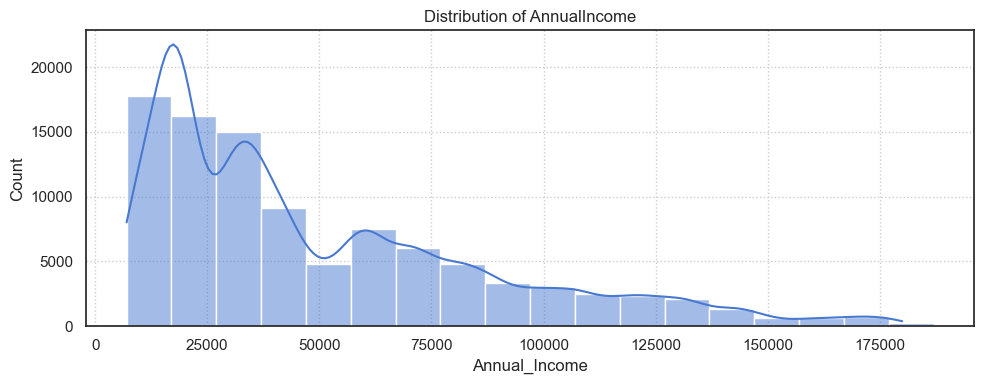

In [14]:
## Univariate Analysis to depict skewness in Annual Income atribute.

fig, my_ax = plt.subplots(figsize=(10,4))

sns.histplot(data = df_credit_merged['Annual_Income'], binwidth=10000, ax=my_ax, kde=True)

plt.grid(linestyle=':')
plt.title('Distribution of AnnualIncome')
plt.tight_layout()
plt.show()

# There is significant right skewness of distribution of Annual_Income towards higher outliers.

In [20]:
## Outlier Treatment - Through Capping & Flooring.

# Any value outside the range between Capping (95th percentile) and Flooring (5th percentile)..
# is considered to be an outlier and hence, should be replaced with..
# Capping (95th percentile) value for higher extreme outliers..
## And Flooring (5th percentile) value for lower extreme outliers.

In [15]:
column = df_credit_merged.select_dtypes(include=['int','float']).columns
column                             ## Depicting all metrices columns from dataset df_credit.

Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly',
       'Monthly_Balance'],
      dtype='object')

In [16]:
for col in column:
    cap = df_credit_merged[col].quantile(0.95)                                         # Cap is the 95th percentile value
    floor = df_credit_merged[col].quantile(0.05)                                       # Floor is the 5th percentile value
    df_credit_merged[col] = df_credit_merged[col].apply(lambda x: cap if x > cap else x)      # Replacing higher extreme outliers with cap value.
    df_credit_merged[col] = df_credit_merged[col].apply(lambda x: floor if x < floor else x)  # Replacing lower extreme outliers with floor value.

In [17]:
# Description of attributes - Post Outlier Treatment

df_credit_merged.describe()

# It can be observed from below that min and max values have been updated.. 
## post outlier treatment.
## However, there are still some considerable mean-median deviation, 
## for eg:- in Annual Income attribute, mean is still higher than median by more than 10,000,
## hence, skewness still persist but we've to accept this as.. 
## this could be primarily due to still presence of relatively higher extreme values at 90 - 95th quantile  
## which can’t be avoided being possible natural variation.

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000,98045.000000
mean,33.297669,49668.047349,4132.639329,5.410536,5.588866,14.454342,3.491070,20.953634,13.303728,10.291307,5.675588,1405.234425,32.350876,222.326779,86.221801,182.697254,398.590871
std,10.443639,35754.187513,2969.594353,2.508088,1.932777,8.504966,2.365852,14.179300,6.003781,6.274890,3.665656,1089.641997,4.907574,96.061482,78.166831,152.653526,185.284705
min,17.000000,9735.115000,837.770417,1.000000,3.000000,2.000000,0.000000,3.000000,2.000000,1.170000,0.000000,118.044000,24.259856,65.000000,0.000000,32.168707,175.089355
25%,24.000000,19357.890000,1628.297500,3.000000,4.000000,7.000000,2.000000,10.000000,9.000000,5.330000,3.000000,566.400000,28.141653,145.000000,25.590900,73.754199,270.427292
50%,33.000000,37070.000000,3099.872500,5.000000,5.000000,13.000000,3.000000,18.000000,14.000000,9.400000,5.000000,1165.770000,32.461730,220.000000,61.613296,129.447673,337.505030
75%,42.000000,71735.480000,5969.673333,7.000000,7.000000,20.000000,5.000000,28.000000,18.000000,14.840000,8.000000,1942.400000,36.580673,302.000000,131.472173,234.375729,472.481497
max,52.000000,130393.960000,10841.936667,10.000000,9.800000,31.000000,8.000000,54.000000,23.000000,23.590000,12.000000,4074.720000,40.246726,381.000000,264.306822,598.331044,865.254346


<a id = Section6></a>
# 6. Exploratory Data Analysis

1. Understanding Data granularity and Imbalances
2. Univariate Exploration of Metrics Importance on Target
3. Univariate Exploration of Dimensions Importance on Target

<a id = Section6.1></a>
6.1 Understanding Data granularity and Imbalances

In [19]:
# The data granularity is at the level of credit details recorded for a particula Customer ID.. 
## for each 8 month (Jan - Aug). 
# Each unique Customer ID denotes a unique customer.
# For each month for a single customer, there are variations in following credit details from other months:
# delay from due date, Num_of_Delayed_Payment, Changed_Credit_Limit, Num_Credit_Inquiries, 
# Credit_Utilization_Ratio, Credit_History_Age,  payment behavior, monthly balance etc.

df_credit_merged[df_credit_merged['Customer_ID'] == 'CUS_0x98ed']

,Customer_ID,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Last_Loan_8,Last_Loan_7,Last_Loan_6,Last_Loan_5,Last_Loan_4,Last_Loan_3,Last_Loan_2,Last_Loan_1,Credit_Score,Month
0,CUS_0x98ed,31.0,Journalist,22229.06,1672.421667,6.0,4.0,5.0,3.0,10.0,...,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Debt Consolidation Loan,Standard,August
11389,CUS_0x98ed,31.0,Journalist,22229.06,1672.421667,6.0,4.0,5.0,3.0,6.0,...,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Debt Consolidation Loan,Standard,March
16150,CUS_0x98ed,31.0,Journalist,22229.06,1672.421667,6.0,4.0,5.0,3.0,10.0,...,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Debt Consolidation Loan,Standard,April
25871,CUS_0x98ed,31.0,Journalist,22229.06,1672.421667,6.0,4.0,5.0,3.0,10.0,...,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Debt Consolidation Loan,Standard,July
31074,CUS_0x98ed,31.0,Journalist,22229.06,1672.421667,6.0,4.0,5.0,3.0,10.0,...,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Debt Consolidation Loan,Standard,January
35019,CUS_0x98ed,31.0,Journalist,22229.06,1672.421667,6.0,4.0,5.0,3.0,10.0,...,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Debt Consolidation Loan,Standard,May
46531,CUS_0x98ed,31.0,Journalist,22229.06,1672.421667,6.0,4.0,5.0,3.0,10.0,...,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Debt Consolidation Loan,Standard,February
49958,CUS_0x98ed,31.0,Journalist,22229.06,1672.421667,6.0,4.0,5.0,3.0,10.0,...,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Debt Consolidation Loan,Standard,June


In [20]:
len(df_credit_merged['Customer_ID'].unique())   # There are total 12500 unique customers

12500

In [33]:
df_credit_merged   

# Total customer records = 98045, hence,
# each customer ID will have 7 to 8 unique records (1 record for each month) 
# associated with them (as 98045 total records divided by 12500 unique records).

,Customer_ID,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Last_Loan_8,Last_Loan_7,Last_Loan_6,Last_Loan_5,Last_Loan_4,Last_Loan_3,Last_Loan_2,Last_Loan_1,Credit_Score,Month
0,CUS_0x98ed,31.0,Journalist,22229.060,1672.421667,6.0,4.0,5.0,3.0,10.0,...,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Debt Consolidation Loan,Standard,August
1,CUS_0x36b4,43.0,Musician,17060.705,1685.725417,8.0,3.0,11.0,4.0,24.0,...,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Auto Loan,Auto Loan,Standard,May
2,CUS_0x105b,24.0,Accountant,34428.210,2575.017500,2.0,4.0,8.0,0.0,3.0,...,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Good,April
3,CUS_0x4c4a,21.0,Accountant,12613.920,1155.160000,4.0,6.0,13.0,3.0,14.0,...,No Loan,No Loan,No Loan,No Loan,No Loan,Personal Loan,Student Loan,Home Equity Loan,Standard,January
4,CUS_0x612f,31.0,Journalist,34775.160,3048.930000,7.0,9.0,25.0,5.0,20.0,...,No Loan,No Loan,No Loan,Auto Loan,Mortgage Loan,Auto Loan,Payday Loan,Not Specified,Poor,June
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98040,CUS_0xc52a,46.0,Writer,35032.660,2853.388333,10.0,6.0,31.0,7.0,48.0,...,No Loan,Credit-Builder Loan,Student Loan,Personal Loan,Mortgage Loan,Payday Loan,Payday Loan,Student Loan,Poor,June
98041,CUS_0x83cc,34.0,Engineer,125047.240,10682.603333,2.0,5.0,9.0,0.0,11.0,...,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Standard,March
98042,CUS_0x6ae6,26.0,Lawyer,9735.115,837.770417,8.0,7.0,20.0,6.0,52.0,...,No Loan,No Loan,Not Specified,Student Loan,Auto Loan,Not Specified,Student Loan,Auto Loan,Poor,June
98043,CUS_0x6f0c,20.0,Lawyer,53564.880,4207.740000,5.0,3.0,13.0,2.0,6.0,...,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Mortgage Loan,Personal Loan,Standard,February


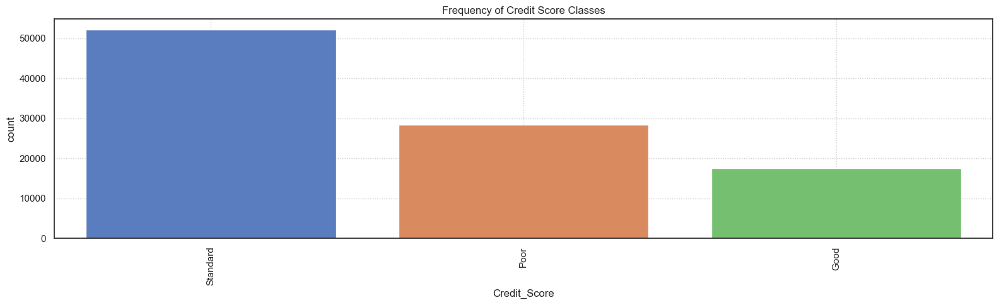

In [137]:
# Checking Target classes imbalance

fig, my_ax = plt.subplots(figsize=(16, 5))

sns.countplot(data = df_credit_merged, 
              x=df_credit_merged['Credit_Score'],
              order=df_credit_merged['Credit_Score'].value_counts().index,
              ax=my_ax)
plt.xticks(rotation=90)

plt.grid(linestyle=':')
plt.title('Frequency of Credit Score Classes')
plt.tight_layout()
plt.show()

# Inference:

# Target classes are quite imbalanced with following classes:
## 'Standard' - above 50,000 records
## 'Poor' - ~27,000 records
## 'Good' - ~18,000 records

<a id = Section6.2></a>
6.2 Univariate Exploration of Metrics Importance on Target

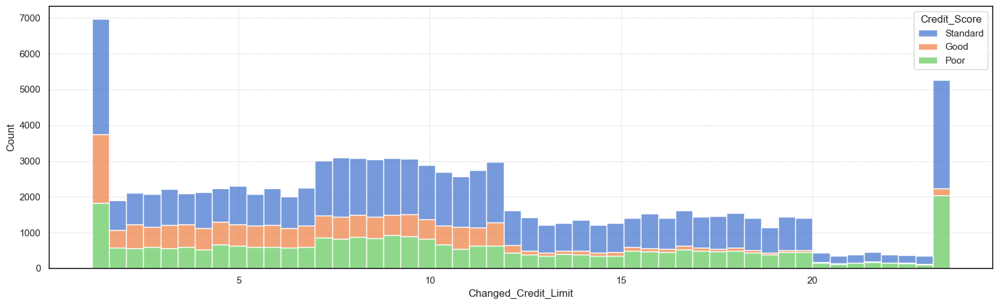

In [139]:
# Analysing Age distribution with respect to credit score

fig, my_ax = plt.subplots(figsize=(16, 5))

sns.histplot(x='Changed_Credit_Limit', hue='Credit_Score', data=df_credit_merged, 
             multiple='stack', bins=50, ax=my_ax)


plt.grid(linestyle=':')
plt.tight_layout()
plt.show()

# Inference:

# For age groups above 50, customers mostly maintain standard credit rating and less people 
## with poor credit rating.
# On the contrary, early age between 17 and 19, 
# we have almost same number of customers maintaining standard and poor rating and least people with good rating.
# Between 20 to 45 age, the credit rating proportion has been consistent with minor fluctuation.
# The hypothesis whether age has any impact on the credit score can be tested in later sections.

In [25]:
# Analysing impact of continuous attributes (metrics) on target - credit score

In [37]:
df_credit_merged_metrics = df_credit_merged.select_dtypes(['int','float'])

In [38]:
df_target = df_credit_merged[['Credit_Score']]   # Seperating a target variable dataframe

In [39]:
df_target.replace(['Standard', 'Good', 'Poor'],  # Converting credit score to numeric values
          [1,2,0],
          inplace=True)
df_target

,Credit_Score
0,1
1,1
2,2
3,1
4,0
...,...
98040,0
98041,1
98042,0
98043,1


In [40]:
df_credit_merged_metrics = pd.concat([df_credit_merged_metrics,df_target], axis=1)

In [41]:
# Creating first sub dataframe df1 for pair plot analysis

df_1 = df_credit_merged_metrics.iloc[:,:8]
df_1 = pd.concat([df_1,df_credit_merged_metrics['Credit_Score']],axis=1)

In [42]:
# Creating second sub dataframe df2 for pair plot analysis

df_2 = df_credit_merged_metrics.iloc[:,8:]
df_2

,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
0,10.0,9.44,9.0,1396.14,33.061861,156.0,52.138474,44.084010,321.019683,1
1,8.0,9.64,2.0,268.81,36.377621,269.0,51.934634,39.628311,327.009597,1
2,12.0,8.51,0.0,180.70,39.917508,326.0,0.000000,84.774645,432.727105,2
3,17.0,17.51,3.0,569.11,39.841494,376.0,16.941903,41.943603,346.630494,1
4,20.0,17.16,6.0,3003.45,36.058472,162.0,126.596814,67.970377,360.325808,0
...,...,...,...,...,...,...,...,...,...,...
98040,18.0,6.52,10.0,1789.00,25.463506,135.0,150.500097,106.840174,287.998562,0
98041,4.0,7.83,0.0,1223.02,33.415357,325.0,0.000000,228.184209,865.254346,1
98042,16.0,19.16,11.0,2271.24,36.752789,224.0,63.795418,32.168707,285.190831,0
98043,7.0,19.98,2.0,1008.31,28.206586,190.0,80.569833,215.490636,384.713531,1


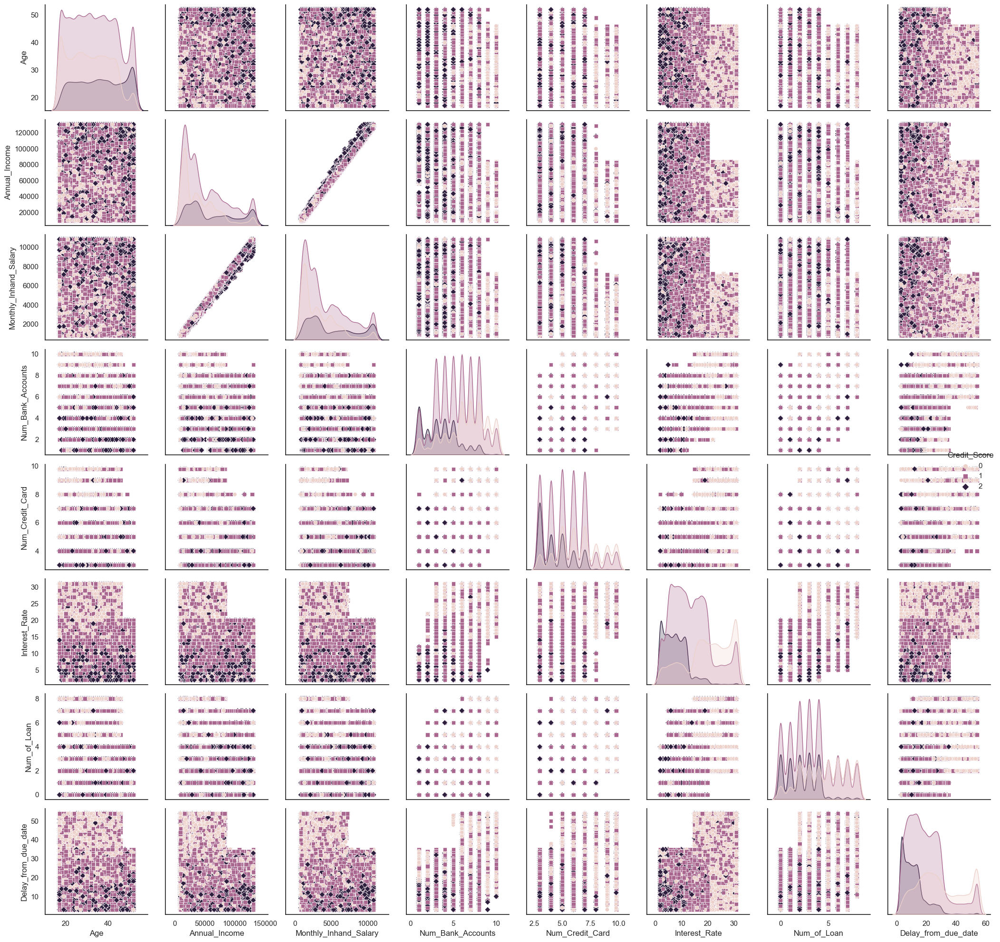

In [43]:
sns.pairplot(df_1,hue='Credit_Score',markers=['o', 's', 'D'])

plt.tight_layout()
plt.show()

# Inference:

# The data seems quite complex and non-linear and difficult to draw patterns as the 
## three credit score classes are not linearly seperable while plotting them as hue in scatter plots.

# However, few insights can be drawn from histograms of the below metrics attributes:

# 1. Population above the age of 50 tends to have more frequency of good credit score holders.
# 2. With the increase in annual income, the frequency of poor credit score customers has declined.
# 3. As the number of bank accounts a customer possess increase, customers have more tendency
##   to maintain a poor credit score  than a good credit score.
# 4. With the increase in number of credit cards a customer possess, the frequency of poor credit score customers is on upward trend
##   while frequency of good credit score customers is on downward trend.
# 5. With increase in interest rate, the tendency to have a good credit score is reduced and tendency for a bad credit score has increased.
# 6.  As the number of loans a customer has increase, customers have more tendency
##   to maintain a poor credit score  than a good credit score.
# 7. As the delay period from due date increases, customers have more tendency
##   to maintain a poor credit score  than a good credit score.

# All the above hypothesis can be validated with ANOVA test and feature importance analysis in later section.

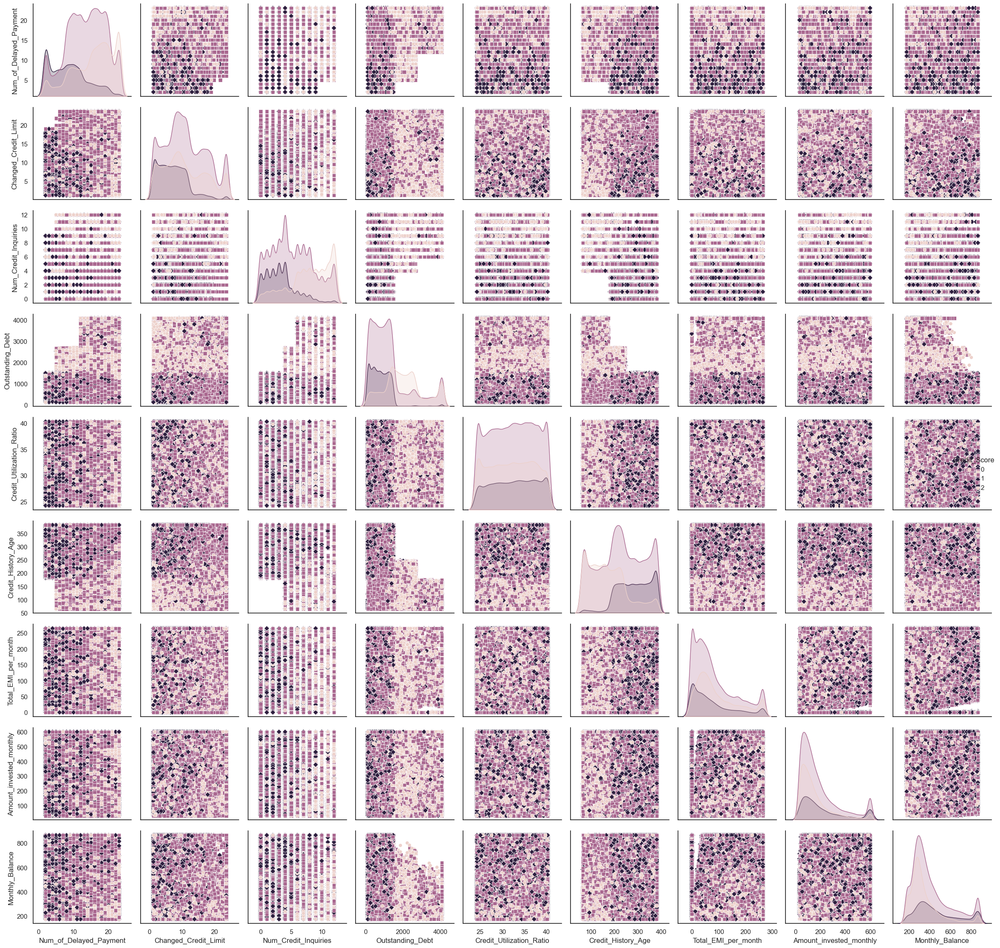

In [44]:
sns.pairplot(df_2,hue='Credit_Score',markers=['o', 's', 'D'])

plt.tight_layout()
plt.show()

# Inference:

# The data seems quite complex and non-linear and difficult to draw patterns as the 
## three credit score classes are not linearly seperable while plotting them as hue in scatter plots.

# However, few insights can be drawn from histograms of the below metrics attributes:

# 1. With the increase in number of delayed payments, the frequency of poor credit score customers has increased and vice versa for good credit score ones.
# 2. Population with changed credit limit either below 2 or above 25 has more frequency of poor credit score customers.
# 3. As the number of credit inquiries increase, customers have more tendency
##   to maintain a poor credit score than a good credit score.
# 4. With the increase in outstanding debt for a customer possess, the frequency of good credit score customers is on downward trend.
# 5. Customers with credit utilisation ratio either below 25 or above 40 have more frequency of people maintaing good credit score..
##   then who have utilisation ratio between 25 and 40.
# 6. As the credit history age increases, customers have more tendency to maintain a good credit score.

# All the above hypothesis can be validated with ANOVA test and feature importance analysis in later section.

<a id = Section6.3></a>
6.3 Univariate Exploration of Dimensions Importance on Target

In [ ]:
# Analysing impact of categorical attributes (dimensions) on target - credit score

In [45]:
df_credit_merged_cat = df_credit_merged.select_dtypes(['object'])

In [46]:
df_credit_merged_cat

,Customer_ID,Occupation,Credit_Mix,Payment_of_Min_Amount,Payment_Behaviour,Last_Loan_9,Last_Loan_8,Last_Loan_7,Last_Loan_6,Last_Loan_5,Last_Loan_4,Last_Loan_3,Last_Loan_2,Last_Loan_1,Credit_Score,Month
0,CUS_0x98ed,Journalist,Standard,Yes,High_spent_Medium_value_payments,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Debt Consolidation Loan,Standard,August
1,CUS_0x36b4,Musician,Standard,Yes,Low_spent_Small_value_payments,No Loan,No Loan,No Loan,No Loan,No Loan,Debt Consolidation Loan,Home Equity Loan,Auto Loan,Auto Loan,Standard,May
2,CUS_0x105b,Accountant,Good,No,High_spent_Small_value_payments,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Good,April
3,CUS_0x4c4a,Accountant,Standard,Yes,Low_spent_Medium_value_payments,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Personal Loan,Student Loan,Home Equity Loan,Standard,January
4,CUS_0x612f,Journalist,Bad,Yes,High_spent_Medium_value_payments,No Loan,No Loan,No Loan,No Loan,Auto Loan,Mortgage Loan,Auto Loan,Payday Loan,Not Specified,Poor,June
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98040,CUS_0xc52a,Writer,Bad,Yes,High_spent_Small_value_payments,No Loan,No Loan,Credit-Builder Loan,Student Loan,Personal Loan,Mortgage Loan,Payday Loan,Payday Loan,Student Loan,Poor,June
98041,CUS_0x83cc,Engineer,Good,No,High_spent_Large_value_payments,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Standard,March
98042,CUS_0x6ae6,Lawyer,Bad,Yes,Low_spent_Small_value_payments,No Loan,No Loan,No Loan,Not Specified,Student Loan,Auto Loan,Not Specified,Student Loan,Auto Loan,Poor,June
98043,CUS_0x6f0c,Lawyer,Standard,Yes,High_spent_Small_value_payments,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,No Loan,Mortgage Loan,Personal Loan,Standard,February


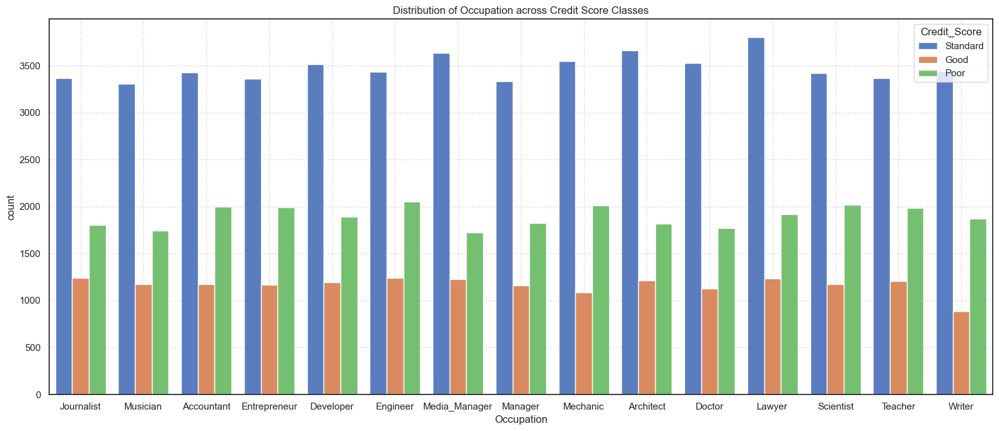

In [47]:
# Analysing Occupation with respect to credit score

fig, my_ax = plt.subplots(figsize=(16, 7))

sns.countplot(x='Occupation', hue='Credit_Score', data=df_credit_merged, 
             ax=my_ax)

plt.title('Distribution of Occupation across Credit Score Classes')

plt.grid(linestyle=':')
plt.tight_layout()
plt.show()

# Inference:

# 1. Lawyer, Teacher and Media Managers have got the highest frequency of good credit score holders.
# 2. While, engineer and scientists have got the highest frequency of poor credit score holders.
# The hypothesis whether occupation has any impact on credit score category can be validated later in chi sqr test and feature importance analysis.

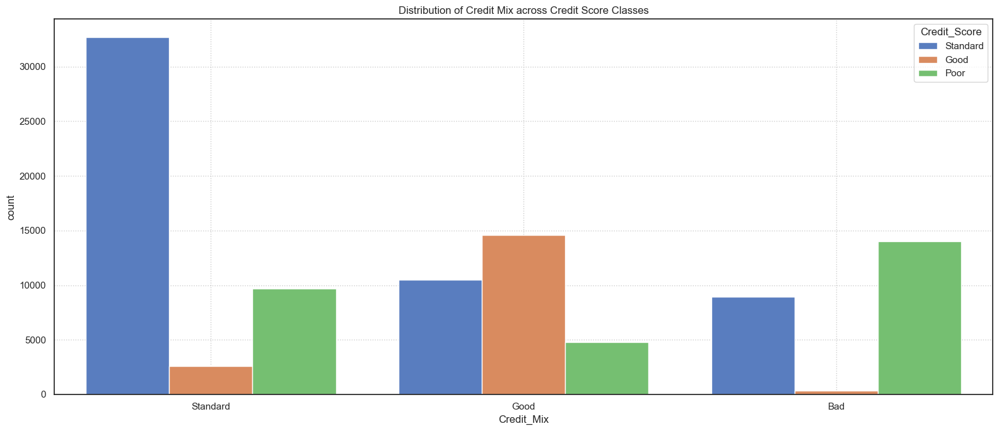

In [48]:
# Analysing Credit Mix with respect to credit score

fig, my_ax = plt.subplots(figsize=(16, 7))

sns.countplot(x='Credit_Mix', hue='Credit_Score', data=df_credit_merged, 
             ax=my_ax)


plt.grid(linestyle=':')
plt.title('Distribution of Credit Mix across Credit Score Classes')

plt.tight_layout()
plt.show()

# Inference:

# 1. Customers with good credit mix have got the highest frequency of good credit score holders.
# 2. While, customers with bad credit mix have got the highest frequency of poor credit score holders.
# The hypothesis whether Credit Mix has any impact on credit score category can be validated later in chi sqr test and feature importance analysis.

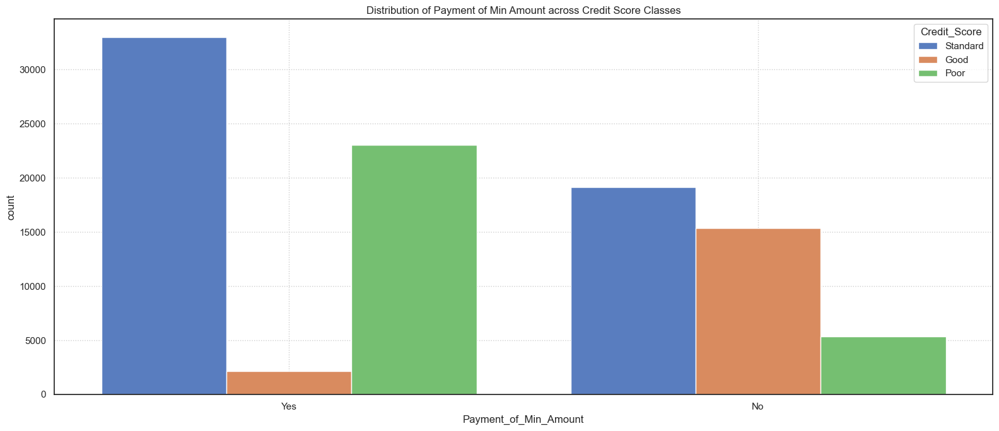

In [49]:
# Analysing Payment of Min Amount with respect to credit score

fig, my_ax = plt.subplots(figsize=(16, 7))

sns.countplot(x='Payment_of_Min_Amount', hue='Credit_Score', data=df_credit_merged, 
             ax=my_ax)


plt.grid(linestyle=':')
plt.title('Distribution of Payment of Min Amount across Credit Score Classes')

plt.tight_layout()
plt.show()

# Inference:

# 1. Customers who have not made the payment of minimum amount have got the highest frequency of good credit score holders.
# 2. While, customers who have made the payment of minimum amount have got the highest frequency of poor credit score holders.
# The hypothesis whether payment of min. amount has any impact on credit score category can be validated later in chi sqr test and feature importance analysis.

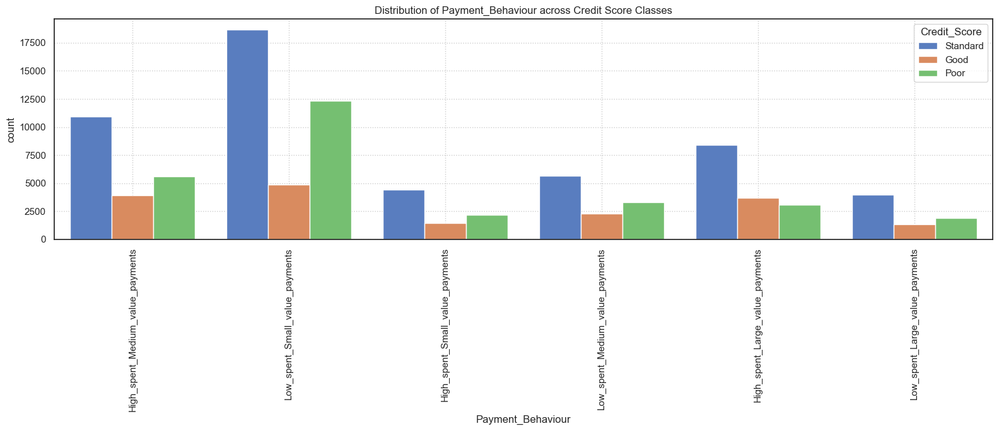

In [102]:
# Analysing Payment_Behaviour with respect to credit score

fig, my_ax = plt.subplots(figsize=(16, 7))

sns.countplot(x='Payment_Behaviour', hue='Credit_Score', data=df_credit_merged, 
             ax=my_ax)


plt.grid(linestyle=':')
plt.title('Distribution of Payment_Behaviour across Credit Score Classes')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

# Inference:

# 1. Customers with 'Low Spent Small Value Payments' payment behavior have got the highest frequency both for good and poor credit score holders.
# 2. Customers with 'Low Spent Large Value Payments' payment behavior have got the lowest frequency both for good and poor credit score holders.
# The hypothesis whether payment behavior has any impact on credit score category can be validated later in chi sqr test and feature importance analysis.

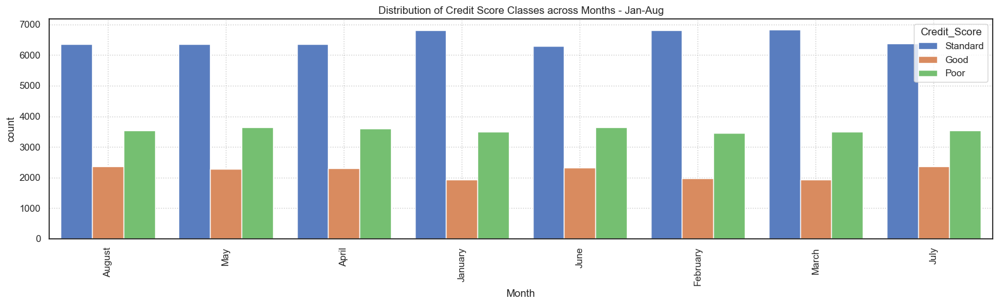

In [100]:
# Analysing credit score across months

fig, my_ax = plt.subplots(figsize=(16, 5))

sns.countplot(x='Month', hue='Credit_Score', data=df_credit_merged, 
             ax=my_ax)


plt.grid(linestyle=':')
plt.title('Distribution of Credit Score Classes across Months - Jan-Aug')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

# Inference:

# 1. August, June and July have got the highest frequency of good credit score holders.
# 2. June has got the highest frequency of poor credit score holders.
# # The hypothesis whether Month has any impact on credit score category can be validated later in chi sqr test and feature importance analysis.

<a id = Section7></a>
# 7. Feature Engineering

In [55]:
# Seperating the dependent target and independent variables

y = df_credit_merged[['Credit_Score']]                # Target Variable

In [56]:
x = df_credit_merged.drop(['Customer_ID', 'Credit_Score'],axis=1)  # Predictor variables

In [57]:
x_categorical = x.select_dtypes(include=['object'])   # Categorical Predictor variables

In [58]:
x_metrics = x.select_dtypes(include=['int','float'])  # Continuous Predictor variables

In [59]:
# Performing chi sqr test to analyse impact of categorical predictors on target variable

for predictor in x_categorical:
    contingency_table = pd.crosstab(y['Credit_Score'], x[predictor])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    print(f"Chi-Square test for {predictor}:")
    print(f"Chi-Square statistic: {chi2}")
    print(f"p-value: {p}")
    print(f"Degrees of freedom: {dof}")
    print(f"Expected frequencies:\n{expected}\n")

Chi-Square test for Occupation:
Chi-Square statistic: 178.16555026256947
p-value: 8.559379584931929e-24
Degrees of freedom: 28
Expected frequencies:
[[1178.20898567 1195.16548524 1176.95955939 1147.15181804 1199.80621143
  1163.5728492  1143.40353919 1241.0372788  1126.80401856 1186.41950125
  1175.88862257 1110.3829874  1179.99388036 1169.99847009 1105.2067928 ]
 [1912.33417308 1939.85602529 1910.30624713 1861.92572798 1947.38832169
  1888.57846907 1855.84195012 2014.30987812 1828.89950533 1925.66054363
  1908.56802489 1802.24676424 1915.23121016 1899.00780254 1793.84535672]
 [3510.45684125 3560.97848947 3506.73419348 3417.92245398 3574.80546688
  3466.84868173 3406.75451068 3697.65284308 3357.29647611 3534.91995512
  3503.54335254 3308.37024836 3515.77490948 3485.99372737 3292.94785048]]

Chi-Square test for Credit_Mix:
Chi-Square statistic: 39711.952869339664
p-value: 0.0
Degrees of freedom: 4
Expected frequencies:
[[ 4155.05635168  5325.05482177  8019.88882656]
 [ 6744.01260646  86

In [ ]:
# On the basis of chi sqr test, we can drop the categorical features where p-value > 0.05 
# as it fails to reject the null hypothesis - no significant correlation between those predictor and target variable - credit score.

In [60]:
x.drop(['Occupation','Last_Loan_9','Month'],axis=1,inplace=True)  # Dropping the required categorical features

In [61]:
# Use replace method to encode the categorical values in target variable to continuos for performing anova test

y.replace(['Standard', 'Good', 'Poor'], 
          [1,2,0],
          inplace=True)

In [62]:
# Performing Correlation ratio (ANOVA) to analyse corelation between continuous predictors and target variable

for metrics in x_metrics:
    F_stat, p_val = stats.f_oneway(x[metrics], y['Credit_Score'])

print("F-statistic:", F_stat)
print("p-value:", p_val)

# The p-value of zero in anova test indicates that strong evidence of 
## significant impact of all continuous predictors on target variable.
## Hence, we can't make a informed decision on what continuous predictors to discard.

F-statistic: 451706.4344726435
p-value: 0.0


In [63]:
# Use replace method to encode the categorical values in x to continuous for model fitting

x['Credit_Mix'].replace(['Standard', 'Good', 'Bad'], 
                        [1,2,3], 
                        inplace=True)

x['Payment_of_Min_Amount'].replace(['Yes', 'No'], 
                                   [1,0], 
                                   inplace=True)

x['Payment_Behaviour'].replace(['High_spent_Medium_value_payments',
       'Low_spent_Small_value_payments',
       'High_spent_Small_value_payments',
       'Low_spent_Medium_value_payments',
       'High_spent_Large_value_payments',
       'Low_spent_Large_value_payments'], 
        [1,2,3,4,5,6], 
        inplace=True)

x['Last_Loan_8'].replace(['No Loan', 'Debt Consolidation Loan', 'Payday Loan',
       'Home Equity Loan', 'Not Specified', 'Auto Loan', 'Student Loan',
       'Mortgage Loan', 'Credit-Builder Loan', 'Personal Loan'], 
        [1,2,3,4,5,6,7,8,9,10], 
        inplace=True)

x['Last_Loan_7'].replace(['No Loan', 'Debt Consolidation Loan', 'Payday Loan',
       'Home Equity Loan', 'Not Specified', 'Auto Loan', 'Student Loan',
       'Mortgage Loan', 'Credit-Builder Loan', 'Personal Loan'], 
        [1,2,3,4,5,6,7,8,9,10],  inplace=True)

x['Last_Loan_6'].replace(['No Loan', 'Debt Consolidation Loan', 'Payday Loan',
       'Home Equity Loan', 'Not Specified', 'Auto Loan', 'Student Loan',
       'Mortgage Loan', 'Credit-Builder Loan', 'Personal Loan'], [1,2,3,4,5,6,7,8,9,10],  inplace=True)

x['Last_Loan_5'].replace(['No Loan', 'Debt Consolidation Loan', 'Payday Loan',
       'Home Equity Loan', 'Not Specified', 'Auto Loan', 'Student Loan',
       'Mortgage Loan', 'Credit-Builder Loan', 'Personal Loan'], [1,2,3,4,5,6,7,8,9,10],  inplace=True)

x['Last_Loan_4'].replace(['No Loan', 'Debt Consolidation Loan', 'Payday Loan',
       'Home Equity Loan', 'Not Specified', 'Auto Loan', 'Student Loan',
       'Mortgage Loan', 'Credit-Builder Loan', 'Personal Loan'], [1,2,3,4,5,6,7,8,9,10],  inplace=True)

x['Last_Loan_3'].replace(['No Loan', 'Debt Consolidation Loan', 'Payday Loan',
       'Home Equity Loan', 'Not Specified', 'Auto Loan', 'Student Loan',
       'Mortgage Loan', 'Credit-Builder Loan', 'Personal Loan'], [1,2,3,4,5,6,7,8,9,10],  inplace=True)

x['Last_Loan_2'].replace(['No Loan', 'Debt Consolidation Loan', 'Payday Loan',
       'Home Equity Loan', 'Not Specified', 'Auto Loan', 'Student Loan',
       'Mortgage Loan', 'Credit-Builder Loan', 'Personal Loan'], [1,2,3,4,5,6,7,8,9,10],  inplace=True)

x['Last_Loan_1'].replace(['No Loan', 'Debt Consolidation Loan', 'Payday Loan',
       'Home Equity Loan', 'Not Specified', 'Auto Loan', 'Student Loan',
       'Mortgage Loan', 'Credit-Builder Loan', 'Personal Loan'], [1,2,3,4,5,6,7,8,9,10],  inplace=True)

In [ ]:
# Understanding relative importance of all variables w.r.t target variable 
## using feature importance chart of decision tree

In [64]:
# Train a decision tree classifier

model = DecisionTreeClassifier(max_depth=3, min_samples_split=5)
model.fit(x, y)

DecisionTreeClassifier(max_depth=3, min_samples_split=5)

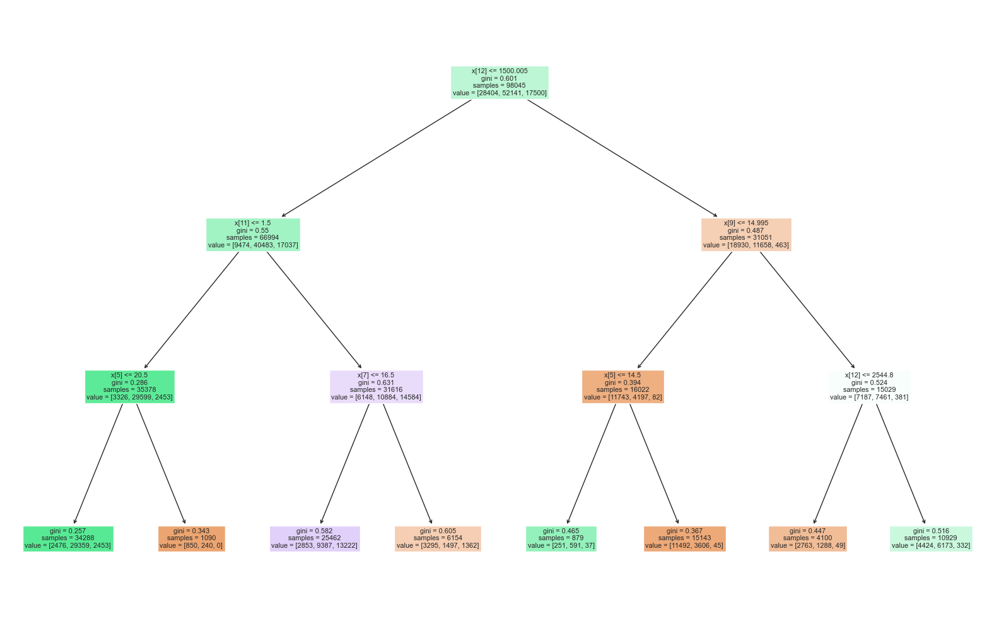

In [65]:
# Plotting a decision tree

plt.figure(figsize=(16, 10))
tree.plot_tree(model, filled=True)

plt.tight_layout()
plt.show()

In [66]:
# Get the relative importances of all independent variables w.r.t. target variable in decision tree

importances = model.feature_importances_     

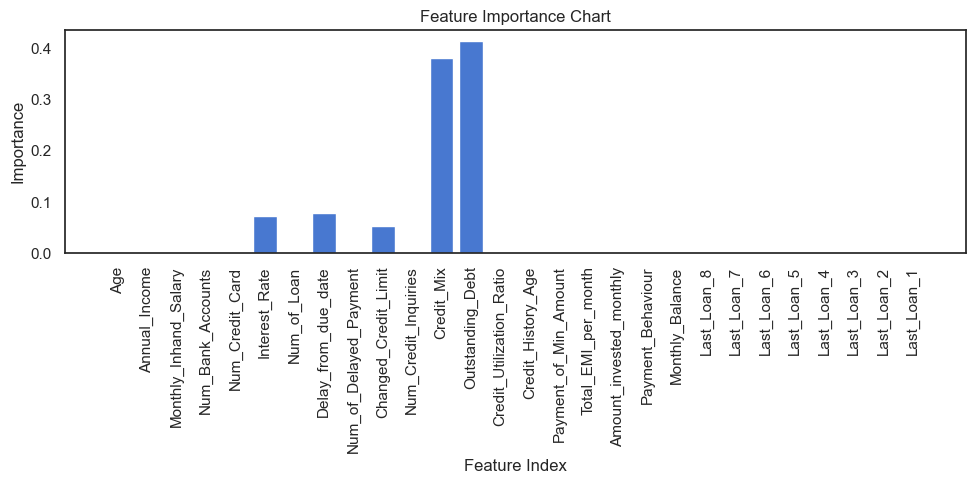

In [67]:
# Feature importance chart as per decision tree

fig, my_ax = plt.subplots(figsize=(10,5))

plt.bar(range(len(importances)), importances)
plt.xticks(range(len(importances)), x.columns, rotation=90)
plt.xlabel('Feature Index')
plt.ylabel('Importance')
plt.title('Feature Importance Chart')

plt.tight_layout()
plt.show()

# Inference:

# Outstanding debt and credit mix are having high correlation with credit score
## followed by delay from due date, Interest rate and changed credit limit.
## Remaining features like age, occupation lie zero in terms of relative importance to credit score.

In [68]:
# Dropping the features which have zero relative importance from decision tree
## and preparing predictor dataset for training in decision tree.

x_tree = x.drop(['Age','Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts','Num_Credit_Card',
                 'Last_Loan_8', 'Last_Loan_7', 'Last_Loan_6', 'Last_Loan_5', 'Last_Loan_4', 'Last_Loan_3', 
                 'Last_Loan_2', 'Last_Loan_1','Payment_of_Min_Amount', 'Total_EMI_per_month',
                 'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
                 'Credit_Utilization_Ratio', 'Credit_History_Age', 'Num_of_Loan', 'Num_of_Delayed_Payment','Num_Credit_Inquiries'], axis=1)

<a id = Section8></a>
# 8. Feature Scaling

In [ ]:
# Scaling the features with z-score scaler in case of decision trees

In [69]:
# Create a StandardScaler object

scaler = StandardScaler()

In [70]:
# Fit and transform the data - x_tree

z_scored_data_tree = scaler.fit_transform(x_tree)

In [73]:
# Converting array of scaled values to dataframe

df_z_scored_tree = pd.DataFrame(z_scored_data_tree, columns=x_tree.columns)

<a id = Section9></a>
# 9. Dimensionality Reduction

In [74]:
# Using umap reducer for dimensionality as our data is complex and non-linear.
## Reducing predictor variables from 5 to 2 using umap reducer.
## Lowering the number of neighbors in non-linear UMAP dimensionality reduction technique

reducer = umap.UMAP(n_components=2, n_neighbors=30)

In [75]:
# Fitting and transforming df_z_scored_tree

x_umap = reducer.fit_transform(df_z_scored_tree)

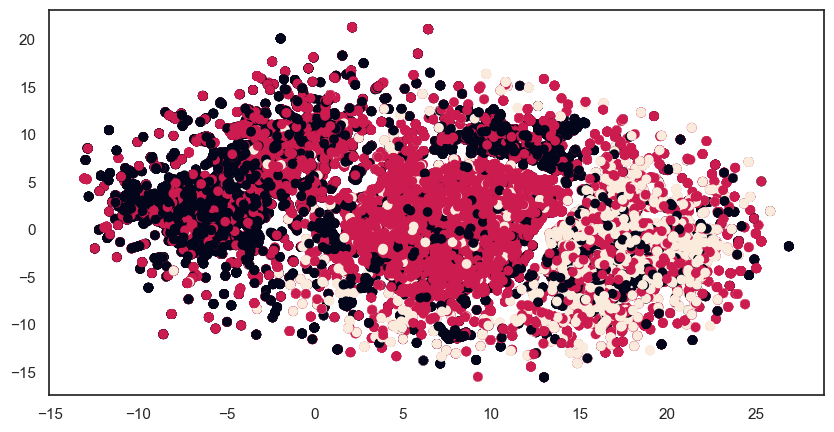

<Figure size 640x480 with 0 Axes>

In [77]:
# Plotting the umap scatter plot 

fig, my_ax = plt.subplots(figsize=(10,5))
plt.scatter(x_umap[:, 0], x_umap[:, 1], c=y['Credit_Score'])

plt.show()
plt.tight_layout()

In [78]:
# Converting umap reduced data to a dataframe

df_umap_tree = pd.DataFrame(x_umap, columns=['UMAP Feature 1','UMAP Feature 2'])

<a id = Section10></a>
# 10. Train Test Split

In [79]:
# Creating a train test split on before umap reduced data for results validation

x_train, x_test, y_train, y_test = train_test_split(df_z_scored_tree, y, test_size=0.3, shuffle=False)

In [80]:
# Creating a train test split on umap reduced data for results validation

x_train_umap, x_test_umap, y_train_umap, y_test_umap = train_test_split(df_umap_tree, y, test_size=0.3, shuffle=False)

<a id = Section11></a>
# 11. Model Training & Prediction

In [81]:
# Training a decision tree classifier on before umap reduced data

model_tree = DecisionTreeClassifier()
model_tree.fit(x_train, y_train)

DecisionTreeClassifier()

In [82]:
# Training a random forest classifier on before umap reduced data

model_forest = RandomForestClassifier(n_estimators=100, random_state=42)
model_forest.fit(x_train, y_train)

RandomForestClassifier(random_state=42)

In [83]:
# Training a decision tree classifier on umap reduced data

model_umap_tree = DecisionTreeClassifier()
model_umap_tree.fit(x_train_umap, y_train_umap)

DecisionTreeClassifier()

In [84]:
# Training a random forest classifier on umap reduced data

model_umap_forest = RandomForestClassifier(n_estimators=100, random_state=42)
model_umap_forest.fit(x_train_umap, y_train_umap)

RandomForestClassifier(random_state=42)

In [85]:
# Predictions from x_test for decision tree (test data from x_tree - before UMAP reduced data)

y_pred_tree = model_tree.predict(x_test)

In [86]:
# Predictions from x_test for random forest (test data from x_tree - before UMAP reduced data)

y_pred_forest = model_forest.predict(x_test)

In [87]:
# Predictions from x_test for decision tree (test data from x_umap - post UMAP reduced data)

y_pred_umap_tree = model_umap_tree.predict(x_test_umap)

In [88]:
# Predictions from x_test for random forest (test data from x_umap - post UMAP reduced data)

y_pred_umap_forest = model_umap_forest.predict(x_test_umap)

<a id = Section12></a>
# 12. Model Evaluation

In [89]:
# Accuracy Score Evaluation for decision tree on before umap reduced data

accuracy = accuracy_score(y_test, y_pred_tree)
"Accuracy:", accuracy

('Accuracy:', 0.7373359624668525)

In [90]:
# Precision, Recall, f1-score for decision tree on before umap reduced data

precision = precision_score(y_test, y_pred_tree, average='macro')
recall = recall_score(y_test, y_pred_tree, average='macro')
f1 = f1_score(y_test, y_pred_tree, average='macro')

print('Precision:',precision)
print('Recall:',recall)
print('f1 score:',f1)      

Precision: 0.7197809506745165
Recall: 0.7227364370646292
f1 score: 0.7203924187411461


In [91]:
# Accuracy Score Evaluation for random forest model on before umap reduced data

accuracy_forest = accuracy_score(y_test, y_pred_forest)
"Accuracy:", accuracy_forest

('Accuracy:', 0.759672264907867)

In [92]:
# Precision, Recall, f1-score for random forest model on before umap reduced data

precision_forest = precision_score(y_test, y_pred_forest, average='macro')
recall_forest = recall_score(y_test, y_pred_forest, average='macro')
f1_forest = f1_score(y_test, y_pred_forest, average='macro')

print('Precision:',precision_forest)
print('Recall:',recall_forest)
print('f1 score:',f1_forest)

Precision: 0.7431533589423442
Recall: 0.7482680943707787
f1 score: 0.7456346274817541


In [93]:
# Accuracy Score Evaluation for decision tree on umap reduced data

accuracy = accuracy_score(y_test_umap, y_pred_umap_tree)
"Accuracy:", accuracy

('Accuracy:', 0.6659753858706738)

In [94]:
# Precision, Recall, f1-score for decision tree on umap reduced data

precision = precision_score(y_test_umap, y_pred_umap_tree, average='macro')
recall = recall_score(y_test_umap, y_pred_umap_tree, average='macro')
f1 = f1_score(y_test_umap, y_pred_umap_tree, average='macro')

print('Precision:',precision)
print('Recall:',recall)
print('f1 score:',f1)      

Precision: 0.6405500578103595
Recall: 0.6410464905341546
f1 score: 0.6407970949434997


In [97]:
# Accuracy Score Evaluation for random forest model on umap reduced data

accuracy_forest_umap = accuracy_score(y_test_umap, y_pred_umap_forest)
"Accuracy:", accuracy_forest_umap

('Accuracy:', 0.7107839804174882)

In [98]:
# Precision, Recall, f1-score for random forest on umap reduced data

precision_forest = precision_score(y_test_umap, y_pred_umap_forest, average='macro')
recall_forest = recall_score(y_test_umap, y_pred_umap_forest, average='macro')
f1_forest = f1_score(y_test_umap, y_pred_umap_forest, average='macro')

print('Precision:',precision_forest)
print('Recall:',recall_forest)
print('f1 score:',f1_forest)      

Precision: 0.6905535032855267
Recall: 0.6857594872190504
f1 score: 0.6880860376830459


In [ ]:
# Conclusion:

# 1. Dimensionality reduction techniques like UMAP might eliminate the important attributes impacting the target variable in case of complex models like decision trees and random forests.
# 2. This can certainly impact the model fit and hence, the accuracy can be reduced post UMAP.
# 3. Hence, we would opt for random forest model based on before UMAP reduced data as it has got higher accurcay.

# 13. Hyperparameter Tuning

In [124]:
# Define the hyperparameter space to search

param_grid = {
    'n_estimators': [10, 50, 100, 200],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 5, 10]
}

In [125]:
# Perform grid search with cross-validation on random forest model before umap reduced data
# Keeping the CV as 2 to reduce computational complexity.

grid_search = GridSearchCV(estimator=model_forest, param_grid=param_grid, cv=2, scoring='accuracy')

In [126]:
# Fitting the training dataset from x_tree

grid_search.fit(x_train,y_train)

GridSearchCV(cv=2, estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': [None, 5, 10, 15],
                         'min_samples_leaf': [1, 5, 10],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [10, 50, 100, 200]},
             scoring='accuracy')

In [130]:
# Finding the best parameters and score

print("Best hyperparameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# The best random forest model has score of 74.8 percent and parameters as below.

Best hyperparameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
Best score: 0.7481895774352647


In [131]:
# Get the best estimator (model) from the grid search

model_forest_best = grid_search.best_estimator_   

In [132]:
# Predictions from best estimator (model)

y_pred_forest_best = model_forest_best.predict(x_test)

In [133]:
# Predicted probabilities from best estimator

y_pred_forest_best_prob = model_forest_best.predict_proba(x_test)
y_pred_forest_best_prob

array([[0.06867935, 0.93132065, 0.        ],
       [0.9567932 , 0.0432068 , 0.        ],
       [0.03123857, 0.41827969, 0.55048174],
       ...,
       [0.93726007, 0.06273993, 0.        ],
       [0.00392796, 0.98722482, 0.00884722],
       [0.01177905, 0.34652916, 0.64169179]])

In [134]:
# Accuracy Score Evaluation for random forest model from best estimator

accuracy_forest_best = accuracy_score(y_test, y_pred_forest_best)
"Accuracy:", accuracy_forest_best

('Accuracy:', 0.7725232882300945)

In [135]:
# Precision, Recall, f1-score for random forest model from best estimator

precision_forest_best = precision_score(y_test, y_pred_forest_best, average='macro')
recall_forest_best = recall_score(y_test, y_pred_forest_best, average='macro')
f1_forest_best = f1_score(y_test, y_pred_forest_best, average='macro')

print('Precision:',precision_forest_best)
print('Recall:',recall_forest_best)
print('f1 score:',f1_forest_best)

Precision: 0.7568671127602743
Recall: 0.7587723144809307
f1 score: 0.7577900200937324
